In [1]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import gzip
import pandas as pd
import anndata
import seaborn as sns
from utilities import load_mquad
import cell2location

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text for PDFs

/home/linxy29/anaconda3/envs/cell2location_cuda118_torch22/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

-----
anndata     0.10.7
scanpy      1.10.1
-----
PIL                 10.2.0
absl                NA
asttokens           NA
attr                23.2.0
cell2location       0.1.4
chex                0.1.86
comm                0.2.2
contextlib2         NA
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0
debugpy             1.8.1
decorator           5.1.1
docrep              0.3.2
etils               1.7.0
exceptiongroup      1.2.0
executing           2.0.1
flax                0.8.4
fsspec              2024.2.0
h5py                3.11.0
igraph              0.11.5
importlib_resources NA
ipykernel           6.29.4
jax                 0.4.28
jaxlib              0.4.28
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
legacy_api_wrap     NA
leidenalg           0.10.2
lightning           2.1.4
lightning_utilities 0.11.2
llvmlite            0.42.0
matplotlib          3.9.0
ml_collections      NA
ml_dtypes           0.4.0
mpl_toolkits       

In [4]:
folder = "/home/linxy29/data/spaceclone/cSCC/"
#folder = "/home/linxy29/holab/linxy/maester/spaceclone/cSCC/"
sample_name = "P4_ST_vis_rep1"
results_folder = folder + sample_name + '/civet_res/'
cell2location_folder = folder + sample_name + '/cell2location_map'
# create the results folder if it doesn't exist
import os
if not os.path.exists(results_folder):
    os.makedirs(results_folder)

# create paths and names to results folders for reference regression and cell2location models
mitoClone_folder = f'{results_folder}/mitoClone/'
run_name = f'{results_folder}/cell2location_map'
if not os.path.exists(mitoClone_folder):
    os.makedirs(mitoClone_folder)

In [ ]:
civet

In [5]:
adata_file = f"{cell2location_folder}/sp.h5ad"
adata = sc.read_h5ad(adata_file)
mod = cell2location.models.Cell2location.load(f"{cell2location_folder}", adata)
adata
## save metadata
#adata.obs.to_csv(os.path.join(folder, sample_name, 'metadata.csv'))

INFO     File /home/linxy29/data/spaceclone/cSCC/P4_ST_vis_rep1/cell2location_map/model.pt already downloaded      


/home/linxy29/anaconda3/envs/cell2location_cuda118_torch22/lib/python3.10/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/linxy29/anaconda3/envs/cell2location_cuda118_torch22/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:72: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
/home/linxy29/anaconda3/envs/cell2location_cuda118_torch22/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/home/linxy29/anaconda3/envs/cell2location_cuda118_torch22/lib/python3.10/site-pack

Epoch 1/30000:   0%|          | 1/30000 [00:01<10:43:48,  1.29s/it, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/30000:   0%|          | 1/30000 [00:01<10:55:18,  1.31s/it, v_num=1]


AnnData object with n_obs × n_vars = 750 × 12379
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ASDC', 'B Cell', 'CD1C', 'CD4_Exh', 'CD4_Naive', 'CD4_Pre_Exh', 'CD4_RGCC', 'CD8_EM', 'CD8_EMRA', 'CD8_Exh', 'CD8_Naive', 'CLEC9A', 'Eccrine', 'Endothelial Cell', 'Fibroblast', 'Keratinocyte', 'LC', 'MDSC', 'Mac', 'Melanocyte', 'Mig_CD1C', 'Mig_CLEC9A', 'Mig_LC', 'Multiplet', 'NK', 'Normal_KC_Basal', 'Normal_KC_Cyc', 'Normal_KC_Diff', 'PDC', 'Pilosebaceous', 'TSK', 'Treg', 'Tumor_KC_Basal', 'Tumor_KC_Cyc', 'Tumor_KC_Diff', 'leiden', 'region_cluster', 'mean_nUMI_factorsfact_0', 'mean_nUMI_factorsfact_1', 'mean_nUMI_factorsfact_2', 'mean_nUMI_factorsfact_3', 'mean_nUMI_factorsfact_4', 'mean_nUMI_factorsfact_5', 'mean_nUMI_factorsfact_6', 'mean_nUMI_factorsfact_7', 'mean_nUMI_factorsfact_8', 'mean_nUMI_factorsfact_9', 'mean_nUMI_factorsfact_10', 'mean_nUMI_factorsfact_11'
    var: 'gene_ids', 'feature_types', 'genome', 'MT_gene'
    uns: '_

## QC and preprocessing

In [6]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

## Select variants based on CIVET

## Add variants information

In [10]:
mode = 'betamquad'
## read variants information
AD, DP, mtSNP_ids = load_mquad(folder + sample_name + '/cellSNP0_' + mode + '/', '', '')
## read barcodes
barcodes = np.genfromtxt(folder + sample_name + '/cellSNP0/cellSNP.samples.tsv', dtype='str')

The number of variants:  2


In [11]:
mtSNP_ids

array(['5168C>T', '8273C>A'], dtype='<U7')

In [12]:
AF = AD / DP
AF = np.nan_to_num(AF)
## convert AF to data frame
AF_df = pd.DataFrame(AF, columns=barcodes, index=mtSNP_ids)

In [13]:
## check the consistency of AF_df index with adata.obs.index
print("The length of AF_df columns is", len(AF_df.columns))
print("The length of adata.obs.index is", len(adata.obs.index))
print("The number of common barcodes is", len(set(AF_df.columns).intersection(set(adata.obs.index))))

The length of AF_df columns is 3719
The length of adata.obs.index is 3719
The number of common barcodes is 3719


In [14]:
## add AF to adata
#adata.obs['n_cells'] = adata.X.sum(axis=1)
AF_df = AF_df.loc[:,adata.obs_names]
AF_df = AF_df.T
AF_df = AF_df.loc[adata.obs_names]
adata.obs = pd.concat([adata.obs, AF_df], axis=1)

In [15]:
adata.obs

,in_tissue,array_row,array_col,sample,_indices,_scvi_batch,_scvi_labels,ASDC,B Cell,CD1C,...,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,dominant_celltype,5168C>T,8273C>A
AAACAAGTATCTCCCA-1,1,50,102,P6_ST_vis_rep1,0,0,0,0.066892,0.199306,0.062543,...,31.018519,39.197531,49.742798,67.849794,0.0,0.0,0.0,TSK,0.0,0.000000
AAACACCAATAACTGC-1,1,59,19,P6_ST_vis_rep1,1,0,0,0.002332,0.185841,0.001949,...,32.962963,51.481481,88.518519,100.000000,0.0,0.0,0.0,Fibroblast,0.0,0.000000
AAACAGAGCGACTCCT-1,1,14,94,P6_ST_vis_rep1,2,0,0,0.003085,0.084608,0.003790,...,31.496063,44.619423,70.866142,100.000000,0.0,0.0,0.0,TSK,0.0,0.000000
AAACAGCTTTCAGAAG-1,1,43,9,P6_ST_vis_rep1,3,0,0,0.017134,2.631664,0.029263,...,24.426451,37.921727,52.091768,92.577598,0.0,0.0,0.0,Fibroblast,0.0,0.333333
AAACAGGGTCTATATT-1,1,47,13,P6_ST_vis_rep1,4,0,0,0.023510,29.926091,0.016083,...,22.404372,32.544019,45.415908,65.452338,0.0,0.0,0.0,B Cell,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,1,58,42,P6_ST_vis_rep1,3714,0,0,0.003690,0.205836,0.003455,...,30.847458,47.796610,81.694915,100.000000,0.0,0.0,0.0,Fibroblast,0.0,0.000000
TTGTTTCATTAGTCTA-1,1,60,30,P6_ST_vis_rep1,3715,0,0,0.002824,0.088093,0.002632,...,31.465517,53.017241,96.120690,100.000000,0.0,0.0,0.0,Fibroblast,0.0,0.000000
TTGTTTCCATACAACT-1,1,45,27,P6_ST_vis_rep1,3716,0,0,0.018536,0.479310,0.015641,...,28.251121,39.461883,61.883408,100.000000,0.0,0.0,0.0,Fibroblast,0.0,0.000000
TTGTTTGTATTACACG-1,1,73,41,P6_ST_vis_rep1,3717,0,0,0.004094,0.061439,0.001593,...,33.971292,57.894737,100.000000,100.000000,0.0,0.0,0.0,Fibroblast,0.0,0.000000


## Cluster clone using vireoSNP

In [16]:
import vireoSNP
from scipy import sparse
from scipy.io import mmread
import matplotlib.pyplot as plt

print(vireoSNP.__version__)

0.5.8


In [17]:
from vireoSNP import BinomMixtureVB
_model = BinomMixtureVB(n_var=AD.shape[0], n_cell=AD.shape[1], n_donor=5)
_model.fit(AD, DP, min_iter=30, n_init=50)

In [18]:
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
raw_col = plt.get_cmap('pink_r', 200)

# Create a LinearSegmentedColormap
new_col = np.vstack((raw_col(np.linspace(0, 0.7, 10)),
                     raw_col(np.linspace(0.7, 1, 90))))
segpink = ListedColormap(new_col, name='segpink')

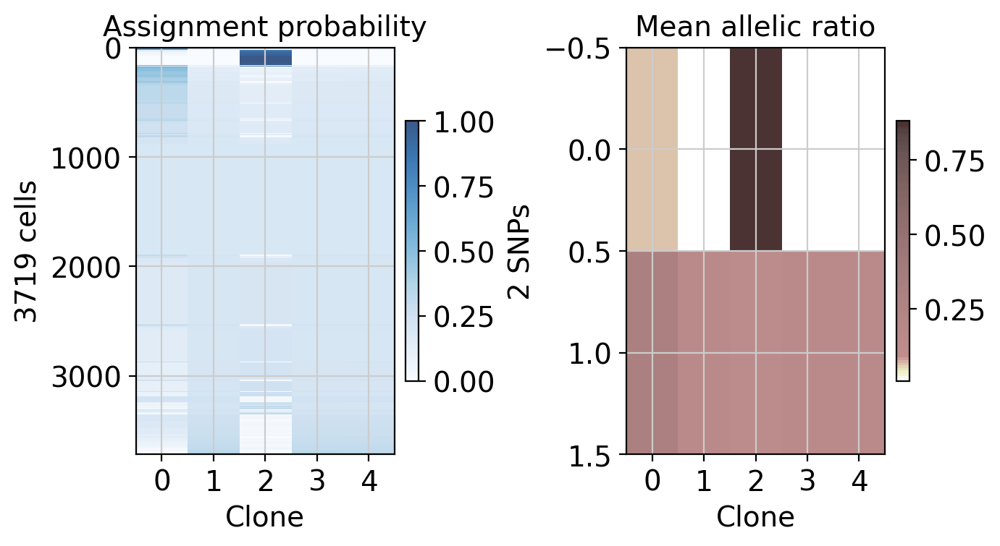

<Figure size 800x400 with 0 Axes>

In [19]:
from vireoSNP.plot import heat_matrix

fig = plt.figure(figsize=(7, 4), dpi=100)
plt.subplot(1, 2, 1)
im = heat_matrix(_model.ID_prob, cmap="Blues", alpha=0.8,
                 display_value=False, row_sort=True)
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.title("Assignment probability")
plt.xlabel("Clone")
plt.ylabel("%d cells" %(_model.n_cell))
plt.xticks(range(_model.n_donor))


plt.subplot(1, 2, 2)
im = heat_matrix(_model.beta_mu, alpha=0.8,
                 display_value=False, row_sort=True, cmap=segpink)
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.title("Mean allelic ratio")
plt.xlabel("Clone")
plt.ylabel("%d SNPs" %(_model.n_var))
plt.xticks(range(_model.n_donor))

plt.tight_layout()
plt.show()
plt.savefig(mitoClone_folder + mode + '_vireoSNP.pdf')

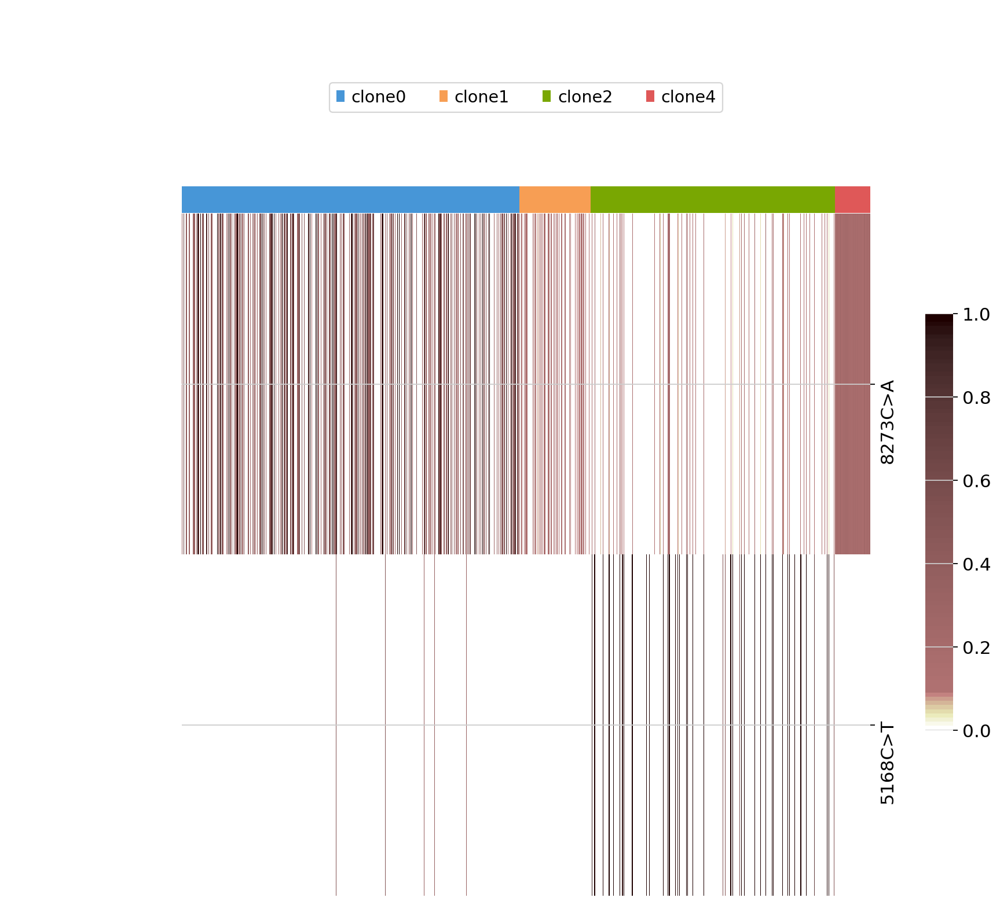

In [20]:
cell_label = np.array(['clone%d' %x for x in np.argmax(_model.ID_prob, axis=1)])
id_uniq = np.unique(cell_label)

# sort variants
clone_ids = np.argmax(_model.ID_prob, axis=1)
AF_mat = AD.A/(DP.A + 0.0001)
var_idx = np.argsort(AF_mat @ (5**(max(clone_ids) - clone_ids)))[::-1]

vireoSNP.plot.anno_heat((AD/DP)[var_idx, :], col_anno=cell_label, col_order_ids=id_uniq,
                        cmap=segpink, yticklabels=mtSNP_ids[var_idx])
plt.savefig(mitoClone_folder + mode + '_vireoSNP_heatmap.pdf')

In [21]:
## add clone assignment to adata
prop_max = _model.ID_prob.argmax(axis=1)
temp = prop_max.astype(str)
cell_label = np.char.add('clone', temp)
adata.obs['clone'] = cell_label

In [22]:
## save clone assignment
cloneDF = adata.obs[['clone']]
cloneDF['barcode'] = cloneDF.index
cloneDF.to_csv(mitoClone_folder + mode + '_clone_assignment.csv', index=False)

/tmp/ipykernel_30103/1893202401.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cloneDF['barcode'] = cloneDF.index


In [23]:
## save metadata
adata.obs.to_csv(mitoClone_folder + mode + '_metadata.csv', index=True)
## save adata
adata.write(mitoClone_folder + mode + '_sp.h5ad')

## Visualization

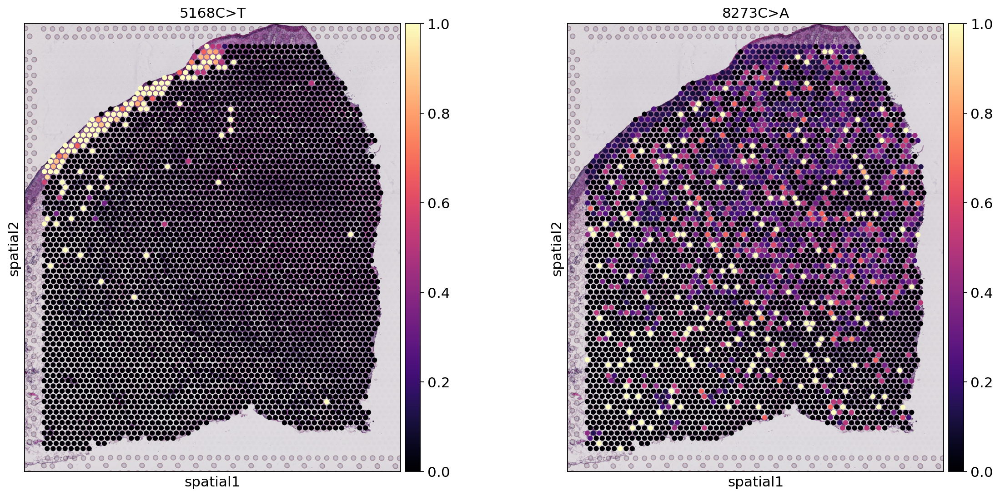

In [24]:
plt.rcParams["figure.figsize"] = (8, 8)
#sc.pl.spatial(adata, img_key="hires", color=["5168C>T", 'Tumor_KC_Basal', 'Tumor_KC_Cyc', 'Tumor_KC_Diff'])
sc.pl.spatial(adata, cmap='magma',
                  # show first 8 cell types
                  color=mtSNP_ids,
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2', show=False)
plt.savefig(mitoClone_folder + mode + '_SNPs.png')

In [25]:
## binarize allele frequency for all SNPs
for mtSNP_id in mtSNP_ids:
    adata.obs[mtSNP_id + '_bin'] = adata.obs[mtSNP_id].apply(lambda x: 1 if x > 0.0 else 0)

adata.obs.head()

,in_tissue,array_row,array_col,sample,_indices,_scvi_batch,_scvi_labels,ASDC,B Cell,CD1C,...,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,dominant_celltype,5168C>T,8273C>A,clone,5168C>T_bin,8273C>A_bin
AAACAAGTATCTCCCA-1,1,50,102,P6_ST_vis_rep1,0,0,0,0.066892,0.199306,0.062543,...,67.849794,0.0,0.0,0.0,TSK,0.0,0.000000,clone2,0,0
AAACACCAATAACTGC-1,1,59,19,P6_ST_vis_rep1,1,0,0,0.002332,0.185841,0.001949,...,100.000000,0.0,0.0,0.0,Fibroblast,0.0,0.000000,clone0,0,0
AAACAGAGCGACTCCT-1,1,14,94,P6_ST_vis_rep1,2,0,0,0.003085,0.084608,0.003790,...,100.000000,0.0,0.0,0.0,TSK,0.0,0.000000,clone0,0,0
AAACAGCTTTCAGAAG-1,1,43,9,P6_ST_vis_rep1,3,0,0,0.017134,2.631664,0.029263,...,92.577598,0.0,0.0,0.0,Fibroblast,0.0,0.333333,clone0,0,1
AAACAGGGTCTATATT-1,1,47,13,P6_ST_vis_rep1,4,0,0,0.023510,29.926091,0.016083,...,65.452338,0.0,0.0,0.0,B Cell,0.0,0.000000,clone2,0,0


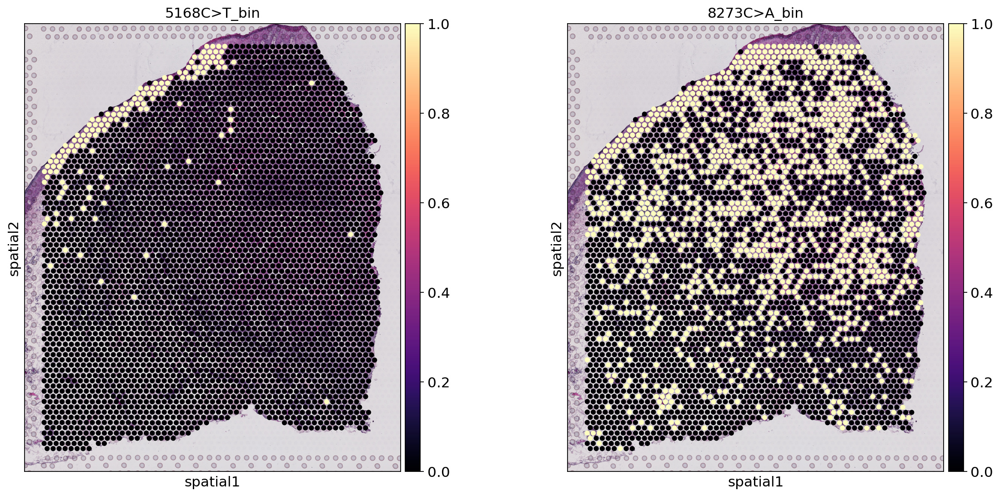

In [26]:
mtSNP_ids_bin = [x + '_bin' for x in mtSNP_ids]
# plot the binary mutation value
plt.rcParams["figure.figsize"] = (8, 8)
#sc.pl.spatial(adata, img_key="hires", color=["5168C>T", 'Tumor_KC_Basal', 'Tumor_KC_Cyc', 'Tumor_KC_Diff'])
sc.pl.spatial(adata, cmap='magma',
                  # show first 8 cell types
                  color=mtSNP_ids_bin,
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2', show=False)
plt.savefig(mitoClone_folder + mode + '_binSNPs.png')

### Calculate the sparsity of mutation

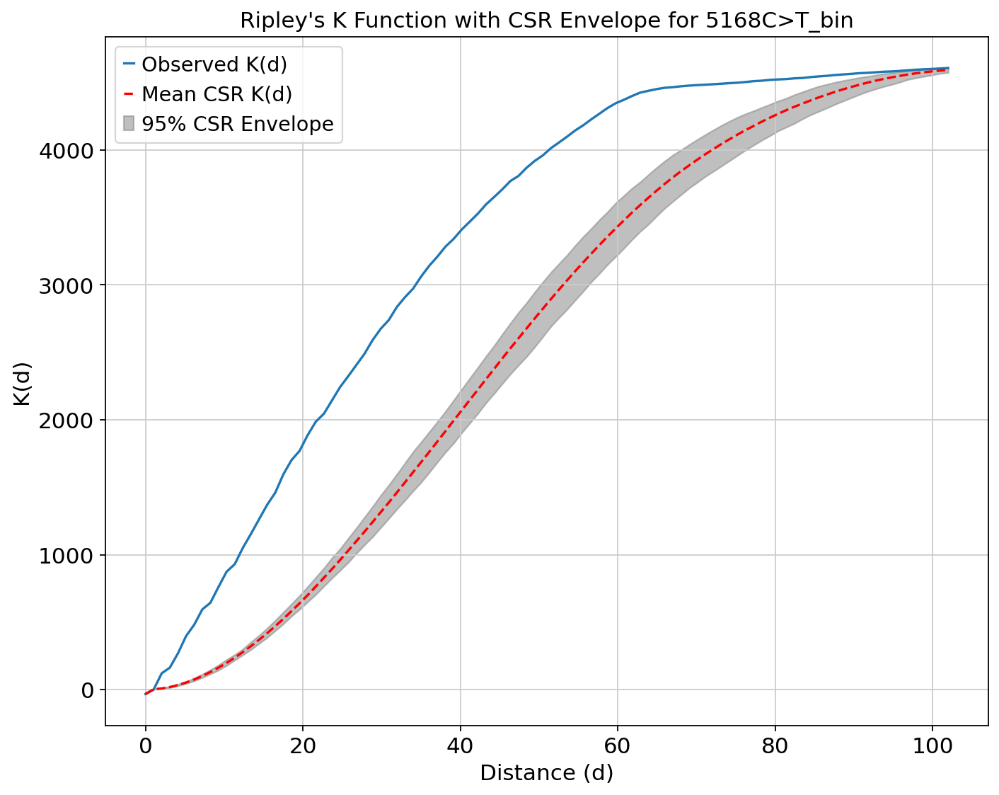

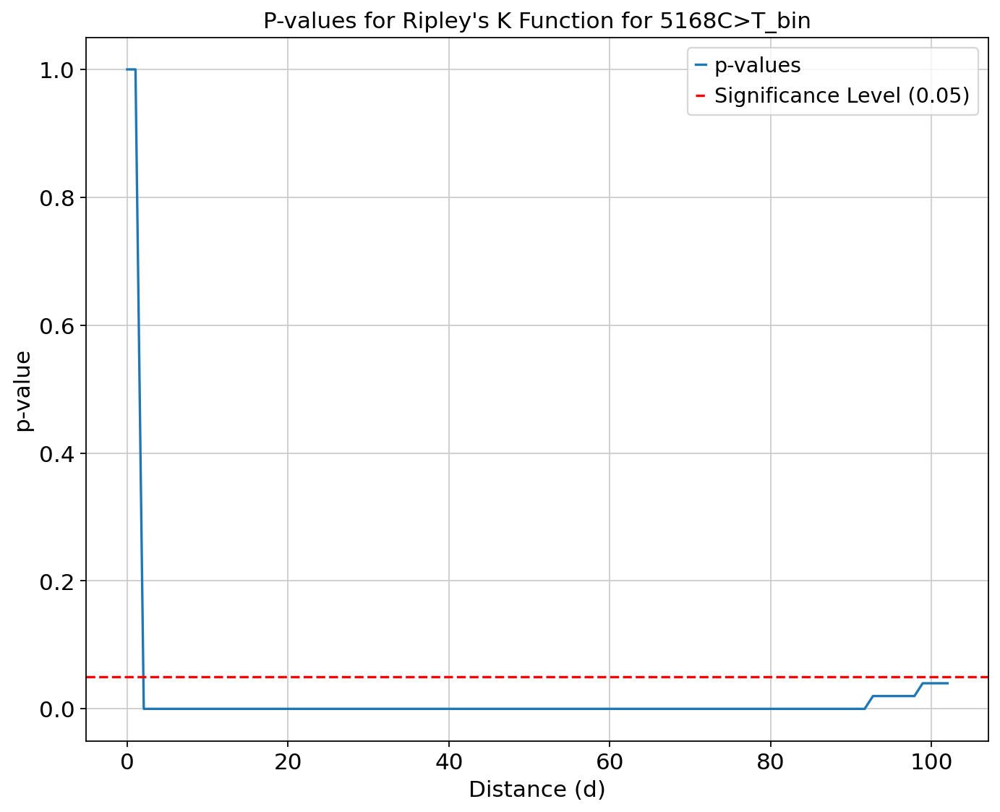

Mutation: 5168C>T_bin, Distance at p-value 0.05: 2.0606060606060606


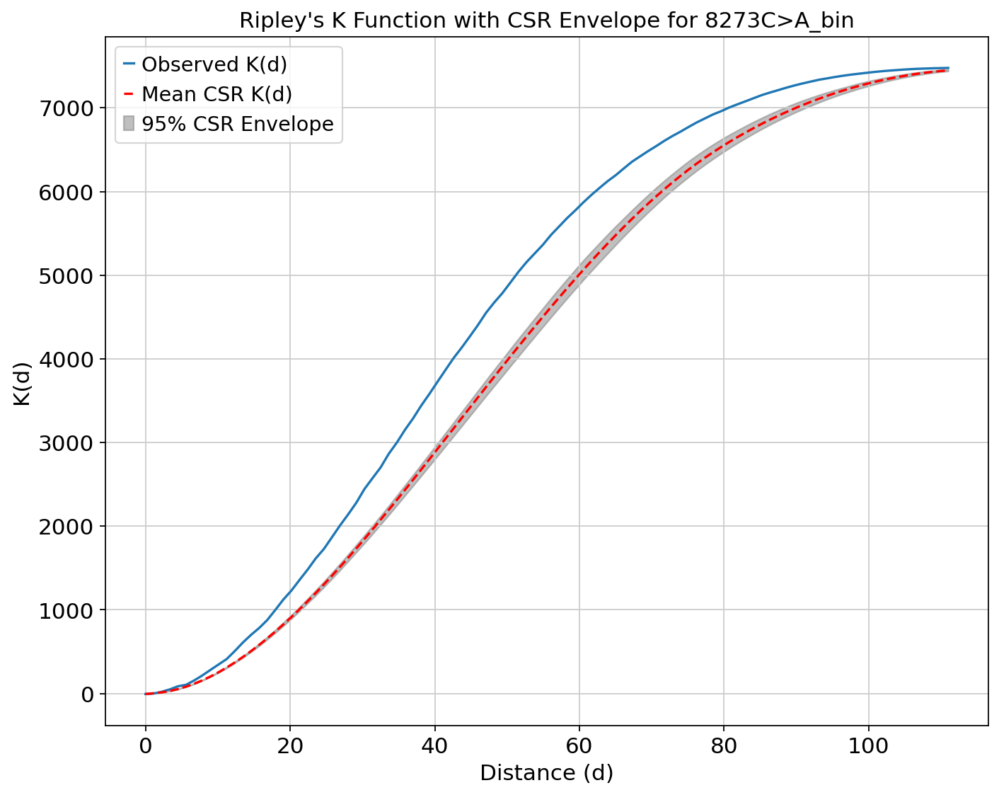

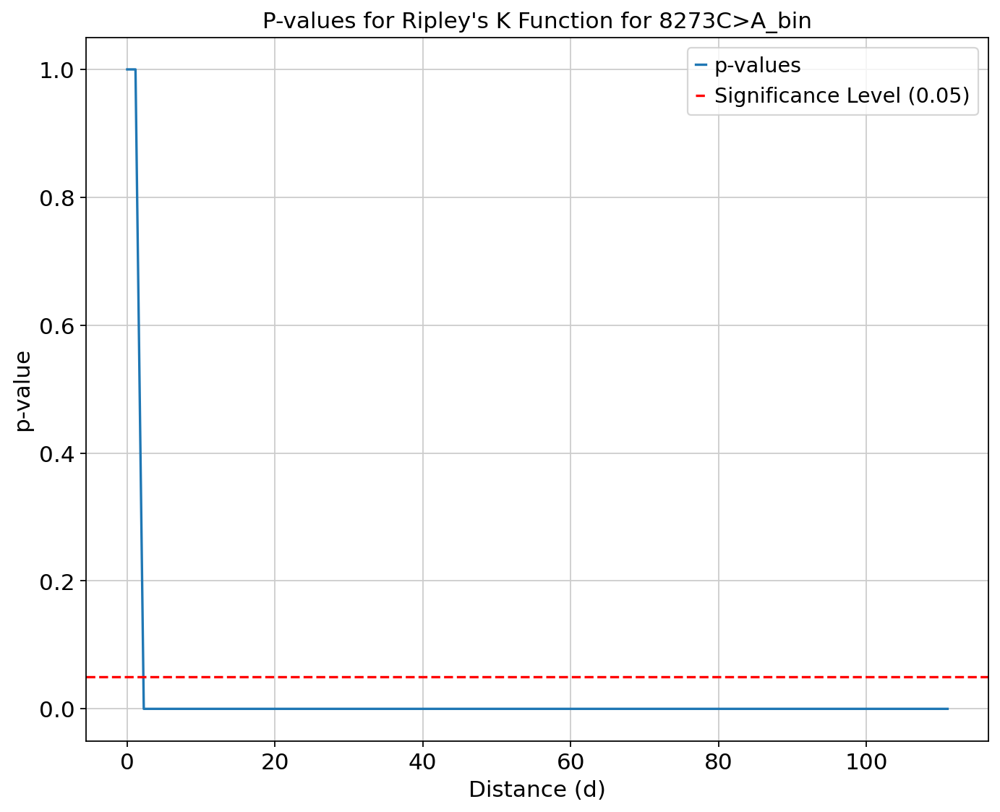

Mutation: 8273C>A_bin, Distance at p-value 0.05: 2.242424242424242
Mean distance at p-value 0.05: 2.1515151515151514


In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix, ConvexHull

def ripley_k_function(points, d_range, area):
    N = len(points)
    dist_matrix = distance_matrix(points, points)
    
    K_values = []
    for d in d_range:
        count = np.sum(dist_matrix < d) - N  # Subtract self-counts
        K = (area / (N * (N - 1))) * count
        K_values.append(K)
    
    return K_values

def simulate_csr(points, num_simulations, d_range, area):
    hull = ConvexHull(points)
    min_x, min_y = np.min(hull.points, axis=0)
    max_x, max_y = np.max(hull.points, axis=0)
    
    K_simulated = []
    for _ in range(num_simulations):
        random_points = np.column_stack((
            np.random.uniform(min_x, max_x, len(points)),
            np.random.uniform(min_y, max_y, len(points))
        ))
        K_simulated.append(ripley_k_function(random_points, d_range, area))
    
    return np.array(K_simulated)

# List to store results
results = []

# Iterate over each mutation in mt_SNPs_bin
for mutation in adata.obs.columns:
    if mutation.endswith("_bin"):
        filtered_rows = adata.obs[adata.obs[mutation] == 1]
        
        # Extract coordinates
        points = filtered_rows[["array_row", "array_col"]].values

        if len(points) < 3:  # Skip if there are less than 3 points to form a convex hull
            continue

        # Calculate the convex hull to get the study area
        hull = ConvexHull(points)
        area = hull.volume  # Area of the convex hull

        # Define the range of distances to evaluate K function
        d_range = np.linspace(0, max(np.ptp(points, axis=0)), 100)

        # Calculate the observed K function
        K_observed = ripley_k_function(points, d_range, area)

        # Simulate CSR to create an envelope
        num_simulations = 100  # Number of CSR simulations
        K_simulated = simulate_csr(points, num_simulations, d_range, area)

        # Calculate the envelope of the CSR simulations
        K_sim_mean = np.mean(K_simulated, axis=0)
        K_sim_lower = np.percentile(K_simulated, 2.5, axis=0)
        K_sim_upper = np.percentile(K_simulated, 97.5, axis=0)

        # Calculate p-values
        p_values = np.sum(K_simulated >= K_observed, axis=0) / num_simulations

        # Find the distance when p-value is 0.05
        significant_distances = d_range[p_values < 0.05]
        if len(significant_distances) > 0:
            distance_at_p_05 = significant_distances[0]
        else:
            distance_at_p_05 = None

        # Store the result
        results.append({"Mutation": mutation, "Distance_at_p_0.05": distance_at_p_05})

        # Plot the results
        plt.figure(figsize=(10, 8))
        plt.plot(d_range, K_observed, label="Observed K(d)")
        plt.plot(d_range, K_sim_mean, 'r--', label="Mean CSR K(d)")
        plt.fill_between(d_range, K_sim_lower, K_sim_upper, color='gray', alpha=0.5, label="95% CSR Envelope")
        plt.xlabel("Distance (d)")
        plt.ylabel("K(d)")
        plt.legend()
        plt.title(f"Ripley's K Function with CSR Envelope for {mutation}")
        plt.show()

        # Plot p-values
        plt.figure(figsize=(10, 8))
        plt.plot(d_range, p_values, label="p-values")
        plt.axhline(y=0.05, color='r', linestyle='--', label="Significance Level (0.05)")
        plt.xlabel("Distance (d)")
        plt.ylabel("p-value")
        plt.legend()
        plt.title(f"P-values for Ripley's K Function for {mutation}")
        plt.show()

        print(f"Mutation: {mutation}, Distance at p-value 0.05: {distance_at_p_05}")

# Convert the results to a DataFrame
results_df = pd.DataFrame(results)
results_df.to_csv(mitoClone_folder + mode + '_ripley_k_results.csv', index=False)

# The mean of the distances at p-value 0.05
print(f"Mean distance at p-value 0.05: {results_df['Distance_at_p_0.05'].mean()}")

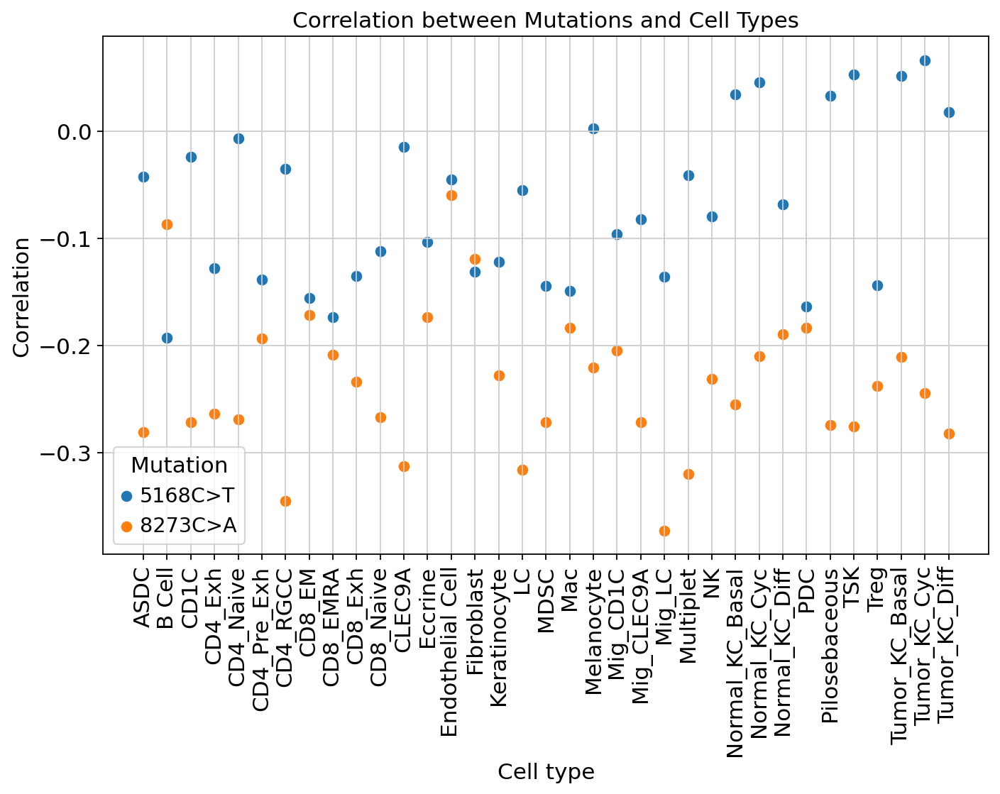

In [28]:
# Extract the name of adata.layers
celltype = list(adata.layers.keys())
mutation = mtSNP_ids

# Calculate the correlation between each mutation and cell type
correlation_data = {}
for mut in mutation:
    filtered_rows = adata.obs[adata.obs[mut] > 0]
    correlation_data[mut] = [np.corrcoef(filtered_rows[ct], filtered_rows[mut])[0, 1] for ct in celltype]

# Convert to a DataFrame
cor_df = pd.DataFrame(correlation_data, index=celltype)

# save the correlation data
cor_df.to_csv(mitoClone_folder + mode + '_correlation.csv', index=True)

# Plot the correlation using a dot plot
plt.figure(figsize=(10, 6))
for mut in mutation:
    plt.scatter(range(len(celltype)), cor_df[mut], label=mut)

plt.xlabel('Cell type')
plt.ylabel('Correlation')
plt.title('Correlation between Mutations and Cell Types')
plt.xticks(range(len(celltype)), celltype, rotation=90)
plt.legend(title='Mutation')
plt.grid(True)
plt.savefig(mitoClone_folder + mode + '_correlation.png')
plt.show()

In [29]:
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
    sc.pl.spatial(adata, cmap='magma',
                  # show first 8 cell types
                  color=["8009G>A", 'Tumor_KC_Basal', 'Tumor_KC_Cyc', 'Tumor_KC_Diff'],
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2', show=False)
    plt.savefig(mitoClone_folder + mode + '_SNPs_celltype1.pdf')

KeyError: 'Could not find key 8009G>A in .var_names or .obs.columns.'

<Figure size 1708.8x400 with 0 Axes>

KeyError: 'Could not find key 7075G>A_bin in .var_names or .obs.columns.'

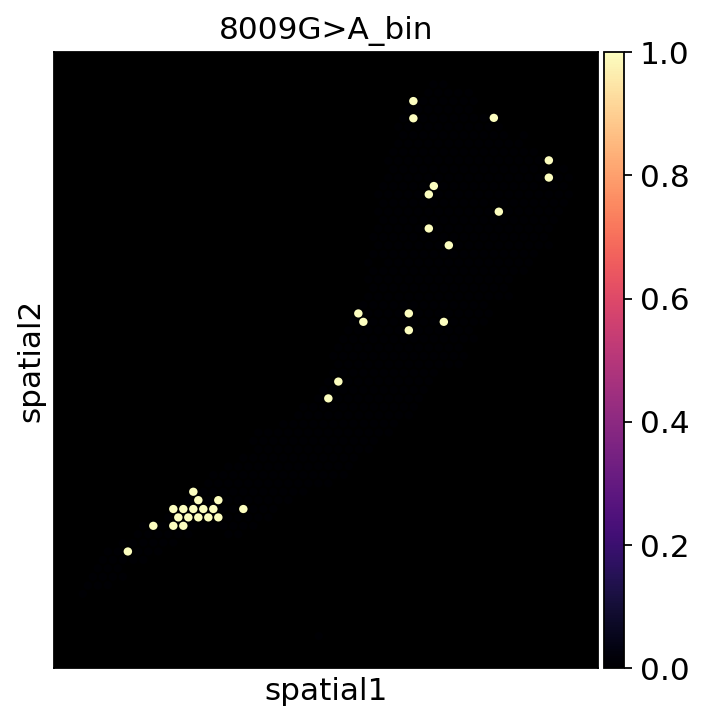

In [ ]:
## define with_tumor =1 if 'Tumor_KC_Basal', 'Tumor_KC_Cyc', 'Tumor_KC_Diff' or 'keratinocyte' larger than 0
adata.obs['tumor_score'] = adata.obs[['Tumor_KC_Basal', 'Tumor_KC_Cyc', 'Tumor_KC_Diff', 'Keratinocyte']].sum(axis=1)
#adata.obs['with_tumor'] = adata.obs['with_tumor'].apply(lambda x: 1 if x > 0 else 0)
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
    sc.pl.spatial(adata, cmap='magma',
                  # show first 8 cell types
                  color=["8009G>A_bin", '7075G>A_bin', '2009G>A_bin', 'tumor_score'],
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2', show=False)

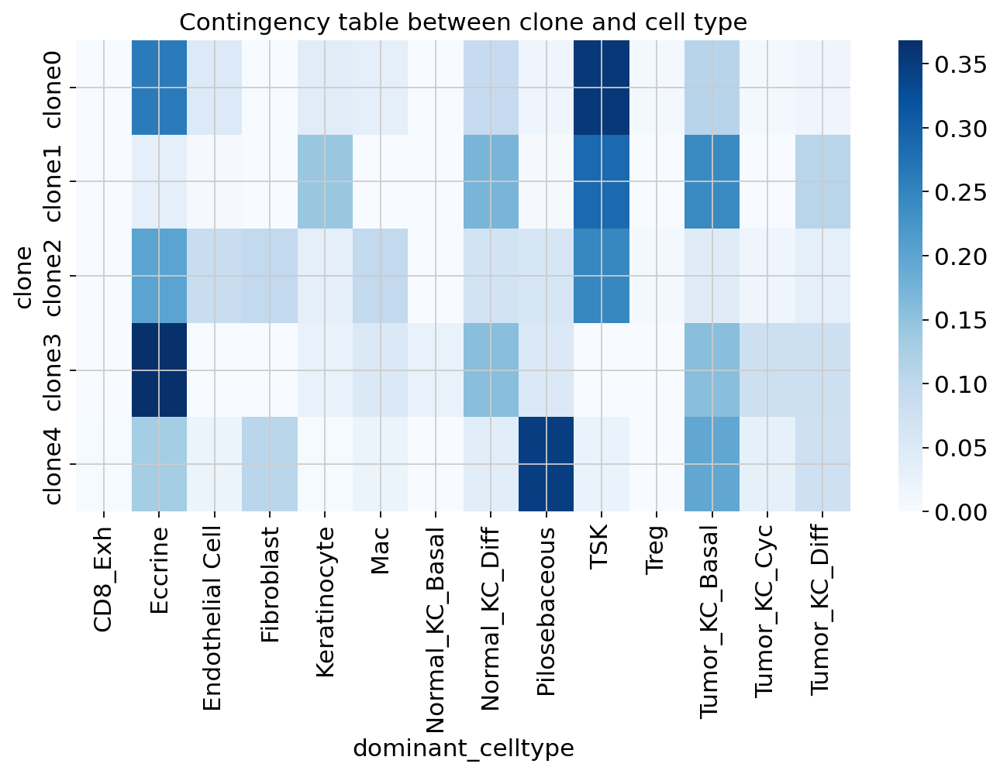

In [ ]:
## calculate the contengency table for clone and cell type
contingency_table = pd.crosstab(adata.obs['clone'], adata.obs['dominant_celltype'])
contingency_table
## normalize along the row
contingency_table = contingency_table.div(contingency_table.sum(axis=1), axis=0)
## plot the contengency table
plt.rcParams['figure.figsize'] = (10, 5)
sns.heatmap(contingency_table, cmap='Blues')
plt.title('Contingency table between clone and cell type')
plt.savefig(mitoClone_folder + mode + '_contingency_table.pdf')


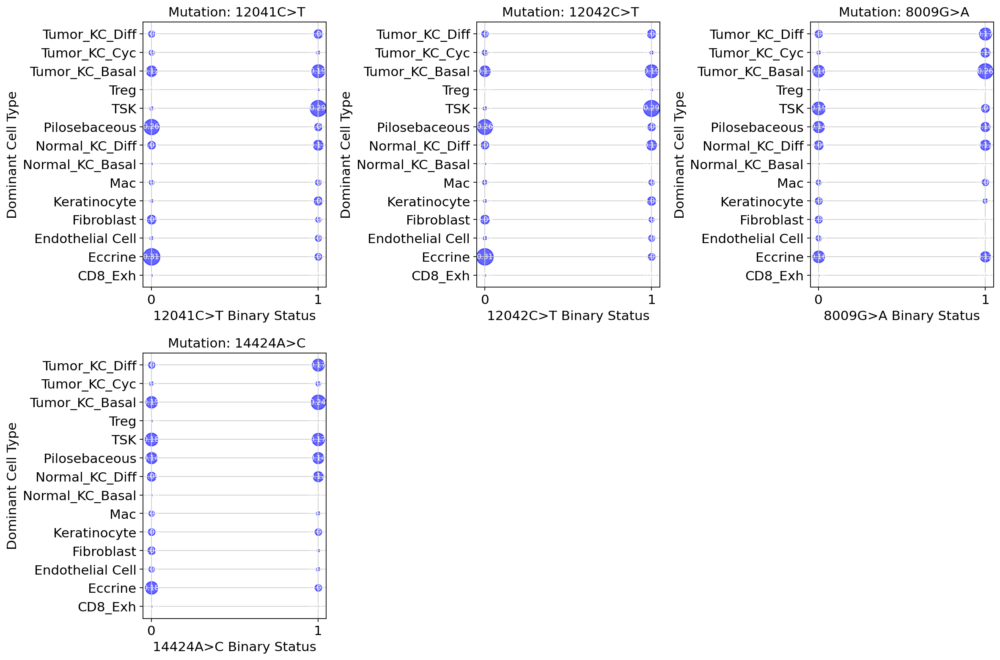

In [ ]:
import math
num_plots = len(mutation)
num_cols = 3  # Number of subplots per row
num_rows = math.ceil(num_plots / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))

for idx, mut in enumerate(mutation):
    row = idx // num_cols
    col = idx % num_cols
    ax = axes[row, col] if num_rows > 1 else axes[col]
    
    # Create contingency table
    cont_table = pd.crosstab(adata.obs['dominant_celltype'], adata.obs[mut + '_bin'])
    
    # Normalize the contingency table to get proportions
    cont_table_proportions = cont_table.div(cont_table.sum(axis=0), axis=1)
    
    # Create the dot plot
    for i, (cell_type, row) in enumerate(cont_table_proportions.iterrows()):
        for j, prop in enumerate(row):
            ax.scatter(j, i, s=prop * 1000, c='b', alpha=0.6)  # Adjust the size multiplier as needed
            ax.text(j, i, f'{prop:.2f}', ha='center', va='center', color='white', fontsize=8)
    
    ax.set_xticks(range(len(cont_table.columns)))
    ax.set_xticklabels(cont_table.columns)
    ax.set_yticks(range(len(cont_table.index)))
    ax.set_yticklabels(cont_table.index)
    ax.set_xlabel(f'{mut} Binary Status')
    ax.set_ylabel('Dominant Cell Type')
    ax.set_title(f' Mutation: {mut}')
    ax.grid(True)

# Remove empty subplots
for idx in range(num_plots, num_rows * num_cols):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout()
plt.show()



### Evaluate the mutation using the whether the mutation is gether together and whether the have bias distribution of cell type

Calculate the level of gathering for mutation.

In [ ]:
## extract mutation and array coordinates
use_col = mtSNP_ids.tolist() + ['array_row', 'array_col']
use_data = adata.obs[use_col]
use_data['barcode'] = use_data.index
use_data = use_data.reset_index(drop=True)
use_data.head()


/tmp/ipykernel_28338/584085661.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  use_data['barcode'] = use_data.index


,12041C>T,12042C>T,8009G>A,7075G>A,2009G>A,array_row,array_col,barcode
0,0.702128,0.717391,0.0,0.0,0.0,50,102,AAACAAGTATCTCCCA-1
1,0.973333,0.973684,0.0,0.0,0.0,61,97,AAACATTTCCCGGATT-1
2,0.046875,0.049180,0.0,0.0,0.0,65,83,AAACCTAAGCAGCCGG-1
3,0.000000,0.000000,0.0,0.0,0.0,35,79,AAACGAGACGGTTGAT-1
4,0.918699,0.926829,0.0,0.0,0.0,65,91,AAACGGGCGTACGGGT-1


In [ ]:
def find_barcodes(df, column_name):
    if column_name not in df.columns:
        raise ValueError(f"Column '{column_name}' does not exist in the DataFrame.")
    
    # Step 1: Filter rows where the specified column has values > 0
    filtered_df = df[df[column_name] > 0]

    result = []
    # Step 2: For each barcode in the filtered DataFrame
    for index, row in filtered_df.iterrows():
        array_row = row['array_row']
        array_col = row['array_col']
        barcode = row['barcode']

        # Step 3: Find barcodes within the specified array_row and array_col range
        filtered_barcode = df[
            (df['array_row'] >= array_row - 2) & 
            (df['array_row'] <= array_row + 2) & 
            (df['array_col'] >= array_col - 1) & 
            (df['array_col'] <= array_col + 1) & 
            (df[column_name] > 0)
        ]

        result.append({
            'barcode': barcode,
            'array_row': array_row,
            'array_col': array_col,
            'matching_barcodes': filtered_barcode['barcode'].tolist()
        })
    
    return result

def calculate_proportion_na_barcodes(results):
    total_barcodes = len(results)
    na_barcodes_count = sum(1 for item in results if not item['matching_barcodes'])
    
    proportion_na_barcodes = na_barcodes_count / total_barcodes if total_barcodes > 0 else 0
    return proportion_na_barcodes

# iterate through the mutation columns and save as a dataframe
noneighbor_prop = []
for mtSNP_id in mtSNP_ids:
    result = find_barcodes(use_data, mtSNP_id)
    proportion_na = calculate_proportion_na_barcodes(result)
    noneighbor_prop.append(proportion_na)
    print(f"Proportion of barcodes with NA matching_barcodes for {mtSNP_id}: {proportion_na:.2f}")

density_df = pd.DataFrame({'mutation': mtSNP_ids, 'noneighbor_prop': noneighbor_prop})
print(density_df.head())
density_df.to_csv(mitoClone_folder + '_' + mode + '_densityDF.csv', index=False)

Proportion of barcodes with NA matching_barcodes for 12041C>T: 0.00
Proportion of barcodes with NA matching_barcodes for 12042C>T: 0.00
Proportion of barcodes with NA matching_barcodes for 8009G>A: 0.00
Proportion of barcodes with NA matching_barcodes for 7075G>A: 0.00
Proportion of barcodes with NA matching_barcodes for 2009G>A: 0.00
   mutation  noneighbor_prop
0  12041C>T              0.0
1  12042C>T              0.0
2   8009G>A              0.0
3   7075G>A              0.0
4   2009G>A              0.0


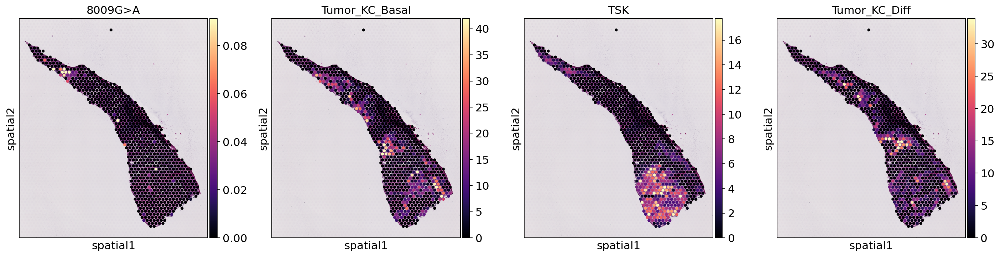

In [ ]:
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
    sc.pl.spatial(adata, cmap='magma',
                  # show first 8 cell types
                  color=["8009G>A", 'Tumor_KC_Basal', 'TSK', 'Tumor_KC_Diff'],
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2', show=False)
    plt.savefig(mitoClone_folder + mode + '_SNPs_celltype2.pdf')

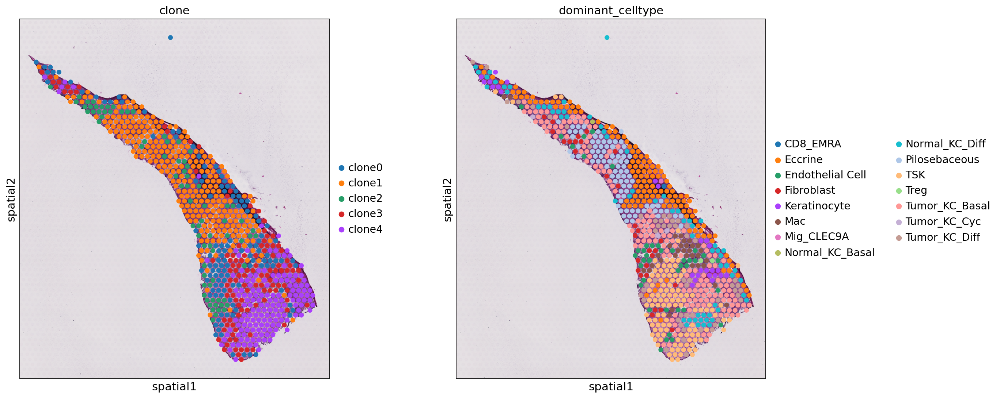

In [ ]:
plt.rcParams["figure.figsize"] = (8, 8)
#sc.pl.spatial(adata, img_key="hires", color=["5168C>T", 'Tumor_KC_Basal', 'Tumor_KC_Cyc', 'Tumor_KC_Diff'])
sc.pl.spatial(adata, cmap='magma',
                  # show first 8 cell types
                  color=['clone', 'dominant_celltype'],
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2', show=False)
plt.savefig(mitoClone_folder + mode + '_clone_celltype.png')

In [ ]:
## calculate the ARI between the cell type and clone assignment
from sklearn.metrics import adjusted_rand_score
ari = adjusted_rand_score(adata.obs['dominant_celltype'], adata.obs['clone'])
print(f"The ARI between the cell type and clone assignment is {ari:.2f}")

The ARI between the cell type and clone assignment is 0.07


Save the cell type information to calculate cell proportion change.